# Salomón Santiago García
## cc 1001003575

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal
from scipy.io.wavfile import read
from IPython.display import Audio

# 1. Transformada de Fourier de tiempo corto - Espectrogramas
## 1.1. Carga, visualizacion y extracción de los segmentos del audio

C:\Users\Salomon\AppData\Local\Temp\ipykernel_5884\3599304916.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, archivo=read('audio5.wav')


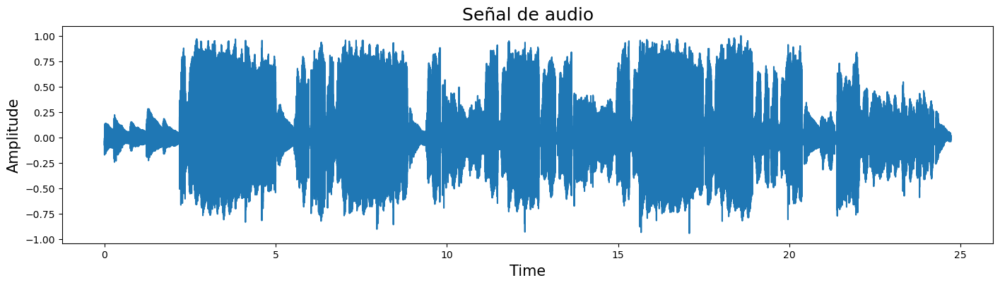

In [17]:
fs, archivo=read('audio5.wav')
archivo=archivo/float(max(abs(archivo)))
t=np.arange(0,len(archivo)/fs,1/fs)

plt.figure(figsize=[17,4])
plt.plot(t,archivo)
plt.title('Señal de audio',fontsize=18)
plt.xlabel('Time',fontsize=15) 
plt.ylabel('Amplitude',fontsize=15) 
plt.show() 
Audio(archivo, rate=fs)

In [18]:
def extraer_ventanas(signal, size, fs):
    #Tamano de paso
    step=int(0.010*fs)
    n_seg = int((len(signal) - size) / step)
    # extraer segmentos
    windows = [signal[i * step : i * step + size] for i in range(n_seg)]
    # stack (cada fila es una ventana)
    return np.vstack(windows)

size=int(0.050*fs)
x=extraer_ventanas(archivo,size,fs)

## 1.3 Aplicación de la STFT

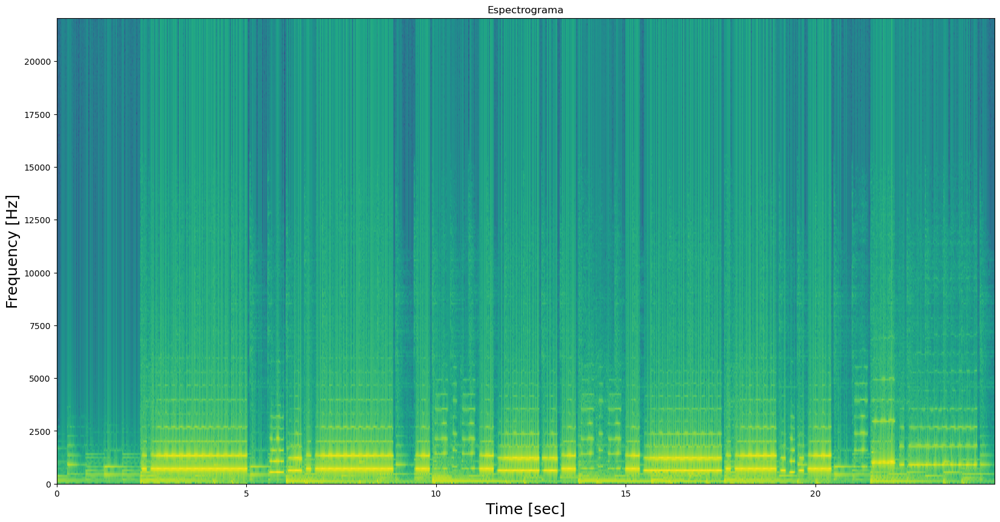

In [19]:
def potspec(X, size, n_padded_min=0):
    # Zero padding para la proxima potencia de 2
    if n_padded_min==0:
        n_padded = max(n_padded_min, int(2 ** np.ceil(np.log(size) / np.log(2))))
    else:
        n_padded = n_padded_min
    # Transformada de Fourier
    Y = np.fft.fft(X, n=n_padded)
    Y = np.absolute(Y)
    # non-redundant part
    m = int(n_padded / 2) + 1
    Y = Y[:, :m]
    return np.abs(Y) ** 2, n_padded

espectro,nfft=potspec(x,size,512)
espectro=np.flipud(10*np.log10(espectro).T)

plt.figure(figsize=(20,10))
plt.title('Espectrograma')
plt.imshow(espectro,aspect='auto', extent=[0, len(archivo)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize=18)
plt.xlabel('Time [sec]', fontsize=18)
plt.show()

Se puede observar que la mayor concentración de frecuencias de la señal de audio esta entre los 500 y 3kHz aproximadamente

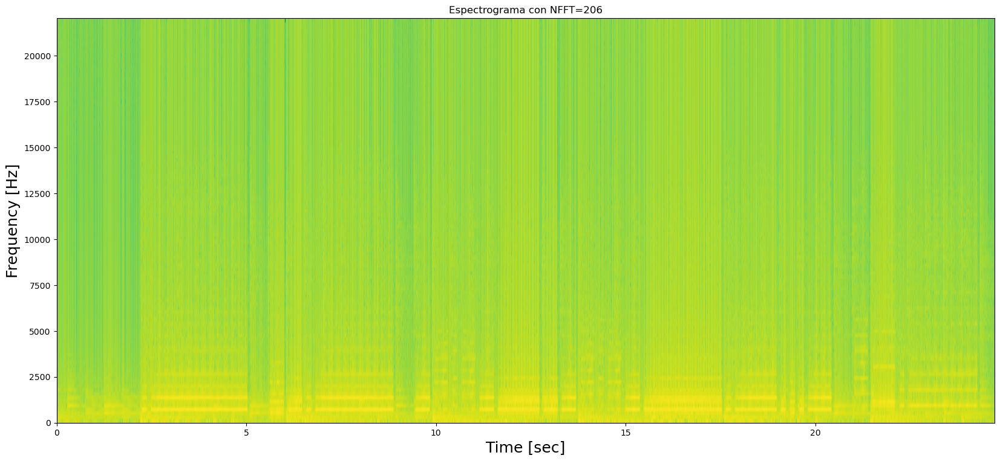

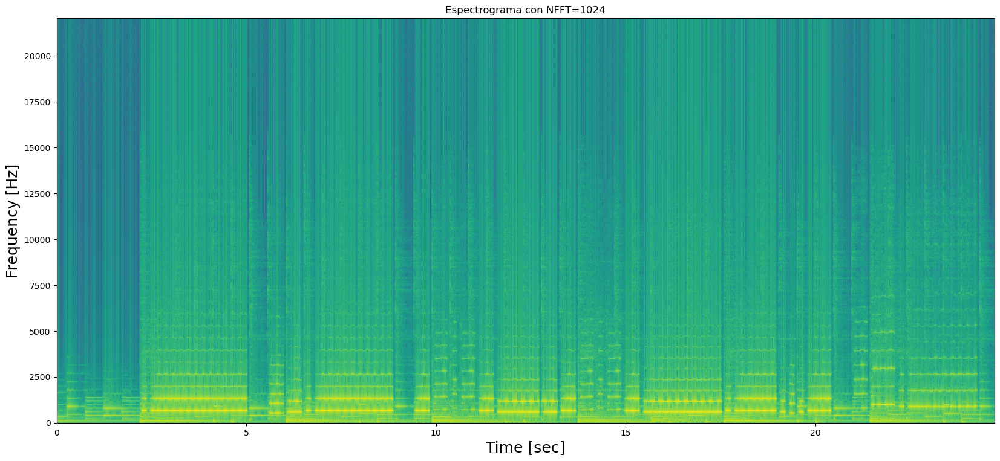

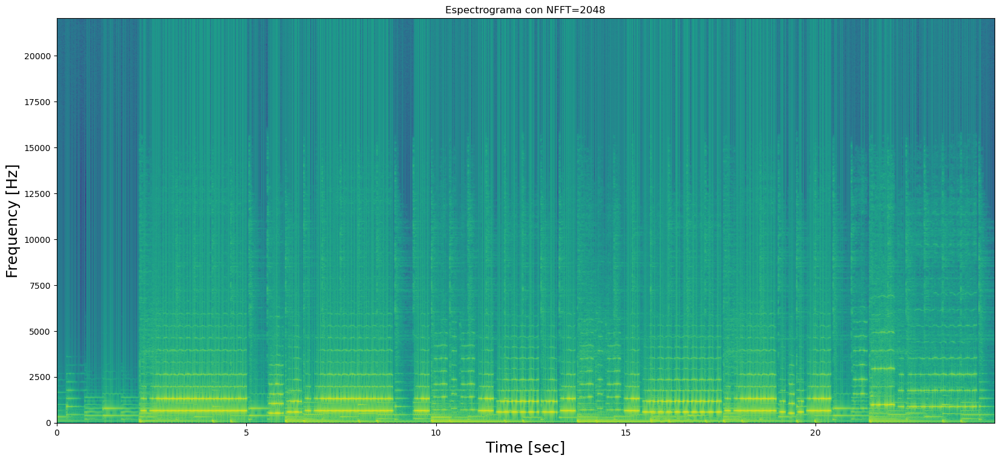

In [20]:
n=[206,1024,2048]

for i in range(0,3):
    espectro,nfft=potspec(x,size,n[i])
    espectro=np.flipud(10*np.log10(espectro).T)
    plt.figure(figsize=(20,40))
    plt.subplot(411+i)
    plt.title('Espectrograma con NFFT={}'.format(n[i]))
    plt.imshow(espectro,aspect='auto', extent=[0, len(archivo)/fs, 0, fs//2])
    plt.ylabel('Frequency [Hz]', fontsize=18)
    plt.xlabel('Time [sec]', fontsize=18)
    
plt.show()

Al variar el NFFT cambia la resolucion del espectograma, a mayor NFFT se puede observar mejor la frecuencia concentrada de la señal, para los valores de NFFT de 1024 y 2048 se observa una mejor resolucion. Cuando se utiliza el tamaño de 206, ilustra que con menos exactitud como esta concentrada la frecuencia del audio. Para efectos practicos esta no brinda una información util para posteriormente poder aplicarle filtros a la señal. Por ende, el mejor tamaño de NFFT es el de 2048.

## 2.	Filtrado de música con filtros FIR
### 1.	Con el audio del numeral anterior, normalice la señal en amplitud, elimine su nivel DC y cree su vector de tiempo dependiendo de su frecuencia de muestreo. Vuelva a reproducirlo e indique que instrumentos se logran escuchar.

44100


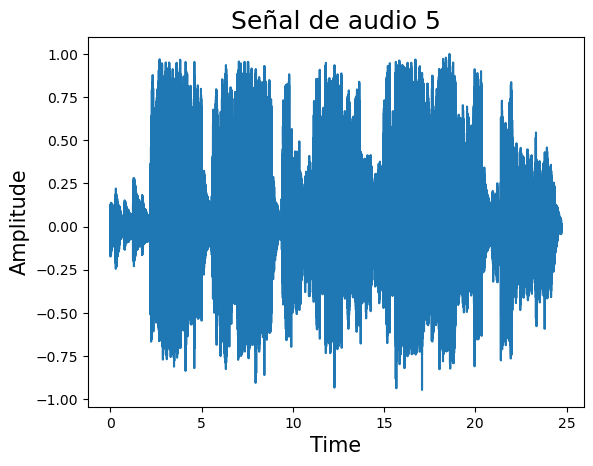

In [21]:
archivo=archivo - np.mean(archivo)
t=np.arange(0,len(archivo)/fs,1/fs)
print(fs)
plt.plot(t,archivo)
plt.title('Señal de audio 5',fontsize=18)
plt.xlabel('Time',fontsize=15) 
plt.ylabel('Amplitude',fontsize=15) 
plt.show() 
Audio(archivo, rate=fs)

Se logra escuchar un piano, un clarinete y unos platillos

### 2.	Diseñe un filtro FIR pasa-bajas donde la frecuencia de corte a emplear la escogerá el estudiante a partir de los espectrogramas realizados en el inicio de la guía. Utilice una banda de transición de 200 Hz y un ripple de 60 dB.

22050.0


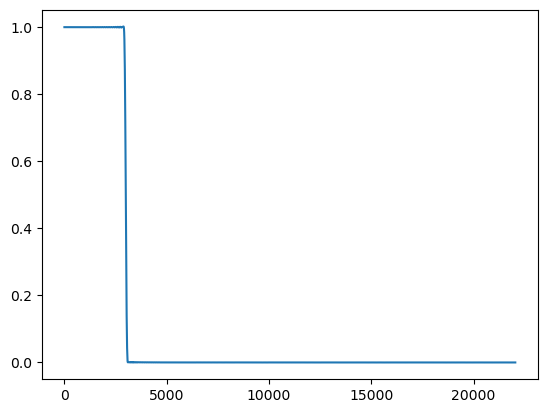

In [22]:
from scipy.signal import kaiserord, lfilter, firwin, freqz


nyq_rate = fs / 2.0
roll_off = 200.0
cutoff_hz = 3000.0
width = roll_off/nyq_rate
ripple_db = 60.0                      #The desired attenuation in the stop band, in dB.
N, _ = kaiserord(ripple_db, width)      # Compute the order and Kaiser parameter for the FIR filter.
taps = firwin(N, cutoff_hz/nyq_rate, pass_zero='lowpass')
w, h = signal.freqz(taps, [1], worN=2000)
plt.plot(nyq_rate*w/np.pi, np.abs(h))
print(nyq_rate)

### 3.	Pase la señal de audio por el filtro diseñado y escúchelo. ¿Qué instrumentos logró escuchar? ¿Alguno dejo se sonar? ¿Explique ?

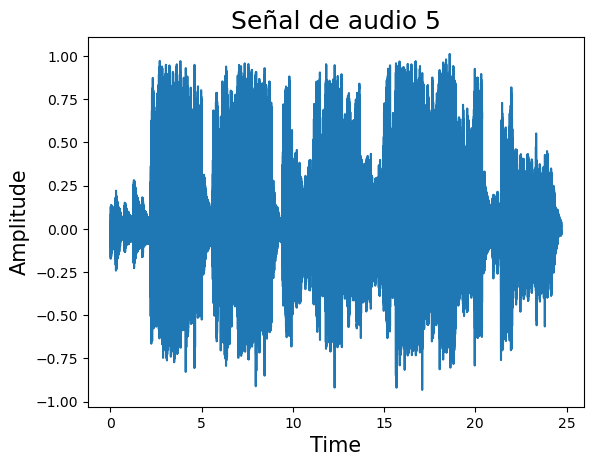

In [23]:
filtered_x = lfilter(taps, 1.0, archivo)
plt.plot(t,filtered_x)
plt.title('Señal de audio 5',fontsize=18)
plt.xlabel('Time',fontsize=15) 
plt.ylabel('Amplitude',fontsize=15) 
plt.show() 
Audio(filtered_x, rate=fs)

Para una frecuencia de corte de 3kHz, se logran escuchar el piano y el clarinete. Evidentemente se dejaron de escuchar los platillos y esto se debe a la frecuencia de corte seleccionada.

### 4.	Si ahora realiza el mismo ejercicio de los ítems 2 y 3 para frecuencias de corte de 400 Hz y 20000 Hz ¿Se pudo separar otro instrumento para este caso? Explique que ocurre en cada frecuencia. 

22050.0


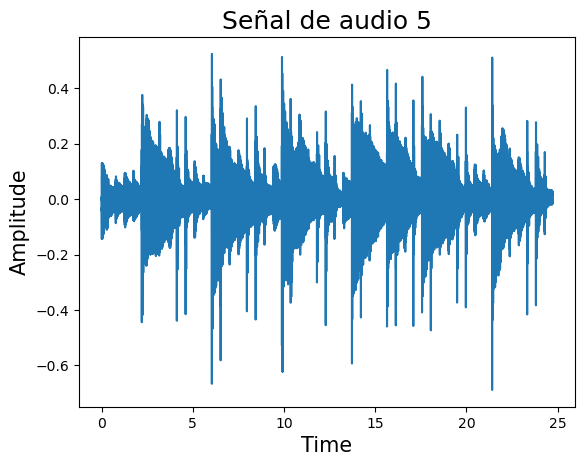

In [38]:
cutoff_hz = 400.0                     #The desired attenuation in the stop band, in dB.
taps = firwin(N, cutoff_hz/nyq_rate, pass_zero='lowpass')
w, h = signal.freqz(taps, [1], worN=2000)
filtered_x = lfilter(taps, 1.0, archivo)
print(nyq_rate)


plt.plot(t,filtered_x)
plt.title('Señal de audio 5',fontsize=18)
plt.xlabel('Time',fontsize=15) 
plt.ylabel('Amplitude',fontsize=15) 
plt.show() 


Audio(filtered_x, rate=fs)

22050.0


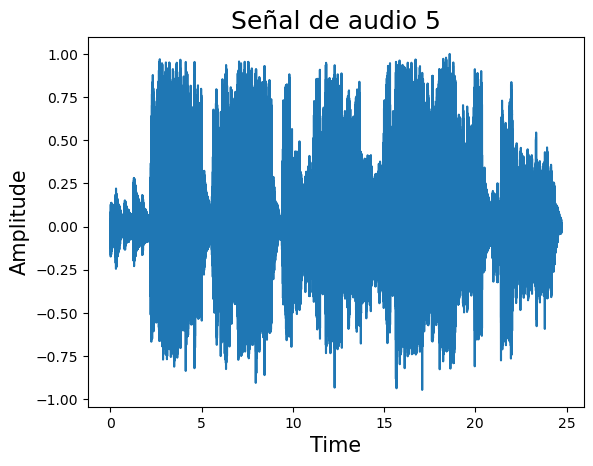

In [39]:
cutoff_hz = 20000.0                     #The desired attenuation in the stop band, in dB.
taps = firwin(N, cutoff_hz/nyq_rate, pass_zero='lowpass')
w, h = signal.freqz(taps, [1], worN=2000)
filtered_x = lfilter(taps, 1.0, archivo)
print(nyq_rate)


plt.plot(t,filtered_x)
plt.title('Señal de audio 5',fontsize=18)
plt.xlabel('Time',fontsize=15) 
plt.ylabel('Amplitude',fontsize=15) 
plt.show() 


Audio(filtered_x, rate=fs)

Para una frecuencia de corte de 400 Hz se puede oir solo el sonido del piano. Mientras que para la frecuencia de 20kHz se escucha practicamente el audio normal, esto debido a que la frecuencia de corte es practicamente la misma a la tasa de Nyquist del audio.

## Conclusiones

- Podemos analizar el espectrograma de una señal para saber en que frecuencias se define la señal observando para que valores de frecuencia el espectrograma esta mas concentrado, estos valores de frecuencias obtenidos se puede usar para reconstruir la señal despues.

- Para un mayor numero de muestras de la transfomada (NFFT) el espectograma va a tener una mejor resolucion, podremos observar mejor las frecuencias que definen la señal para obtener un mejor resultado a la hora de reconstruirla.


- Aunque el espectrograma nos brinda información de donde se encuentra la concentración de frecuencia de una señal, no siempre se puede despreciar el resto de la banda del espectro. Aquí pudimos ver que aunque la concetración de la señal estaba por debajo de lo 3000 Hz aproximadamente, al aplicarle al audio el filtro pasabajas a esa frecuencia de corte ya no se podia escuchar el sonido de los platillos que estaban presentes en el audio original.

- Esta clase de retos incentivan al estudiante a partir de una imagen hacer un analisis, poder entender que es un espectograma y que información brinda puede ser muy util para emplear varias aplicaciones por ejemplo en la industria musical.

-Podemos usar filtros para separar instrumentos en pistas de audios, esto es porque cada instrumento emite sonidos a diferente frecuencia, y al usar un filtro en este caso pasa bajas, al poner frecuencias de corte adecuadas estamos elmininando los instrumentos que emiten sonido a frecuencias mas altas, logrando escuchar en un punto solo el piano ya que es un instrumento de frecuencia demasiado baja.
